# Azure Computer Vision 4 (Florence)

## Fashion Visual Search - Search using an image or a prompt

![Image](florence.jpg)

![Image](fashionheader.png)

<br>
<i>Note: this image was generated with Azure Open AI Dall-e 2</i>

### Visual search with vector embeddings
**Vector embeddings** are a way of representing content such as text or images as vectors of real numbers in a high-dimensional space. These embeddings are often learned from large amounts of textual and visual data using machine learning algorithms like neural networks. Each dimension of the vector corresponds to a different feature or attribute of the content, such as its semantic meaning, syntactic role, or context in which it commonly appears. By representing content as vectors, we can perform mathematical operations on them to compare their similarity or use them as inputs to machine learning models.

![Image](embeddings.jpg)


### Business applications
- **Digital asset management**: Image retrieval can be used to manage large collections of digital images, such as in museums, archives, or online galleries. Users can search for images based on visual features and retrieve the images that match their criteria.
- **Medical image retrieval**: Image retrieval can be used in medical imaging to search for images based on their diagnostic features or disease patterns. This can help doctors or researchers to identify similar cases or track disease progression.
- **Security and surveillance**: Image retrieval can be used in security and surveillance systems to search for images based on specific features or patterns, such as in, people & object tracking, or threat detection.
- **Forensic image retrieval**: Image retrieval can be used in forensic investigations to search for images based on their visual content or metadata, such as in cases of cyber-crime.
- **E-commerce**: Image retrieval can be used in online shopping applications to search for similar products based on their features or descriptions or provide recommendations based on previous purchases.
- **Fashion and design**: Image retrieval can be used in fashion and design to search for images based on their visual features, such as color, pattern, or texture. This can help designers or retailers to identify similar products or trends.

### Visual Search Process
![Image](fashionprocess.png)

### Image Retrieval with Azure Computer Vision Documentation
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/concept-image-retrieval
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/how-to/image-retrieval

### Demo images
Demo images are a sample of this collection of images: https://www.kaggle.com/competitions/h-and-m-personalized-fashion-recommendations/data
<br><br>
> Serge Retkowsky | Microsoft | https://github.com/retkowsky | 3rd of May, 2023

## 1. <a name="chapt1"></a> Librairies

In [1]:
import datetime
import glob
import json
import os
import random
import sys
import time

from dotenv import load_dotenv
from PIL import Image

In [2]:
# Getting Azure CV endpoint and key from the azure.env file

load_dotenv("azure.env")
key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

### Importing our specific functions

In [3]:
pyfile = "azure.py"

print("Python file:", pyfile, "Date:", time.ctime(os.path.getmtime(pyfile)))

Python file: azure.py Date: Fri Jul  7 14:41:50 2023


In [4]:
from azure import (
    describe_image_with_AzureCV4,
    get_image_from_url,
    get_results_using_image,
    get_results_using_prompt,
    remove_background,
    side_by_side_images,
    view_image,
)

## 2. <a name="chapt2"></a> Informations

In [5]:
sys.version

'3.11.3 (v3.11.3:f3909b8bc8, Apr  4 2023, 20:12:10) [Clang 13.0.0 (clang-1300.0.29.30)]'

In [6]:
print("Today is", datetime.datetime.today())

Today is 2023-07-07 21:13:41.324751


## 3. <a name="chapt3"></a> Our products images

In [7]:
IMAGES_DIR = "fashion"

In [8]:
image_files = glob.glob(IMAGES_DIR + "/*")

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: fashion
Total number of catalog images = 1,473


### Some images

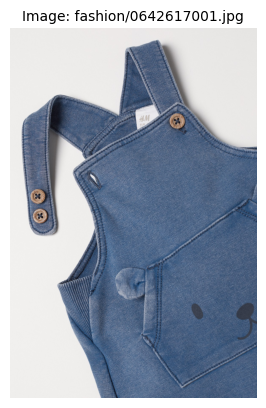

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a blue overalls with a bear face = 1.000

   Detected tags:
    clothing           = 0.994
    jeans              = 0.911
    pattern (fashion design) = 0.844
    work-clothing      = 0.792
    person             = 0.760


In [9]:
idx = 1

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

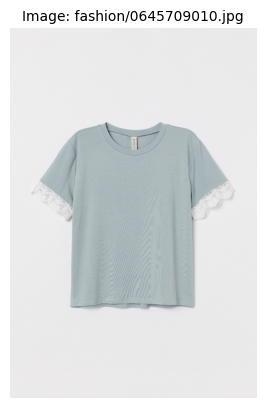

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a blue shirt with white lace sleeves = 1.000

   Detected tags:
    clothing           = 0.998
    active shirt       = 0.942
    top                = 0.904
    casual dress       = 0.866
    shirt              = 0.823
    sleeve             = 0.792


In [10]:
idx = 500

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

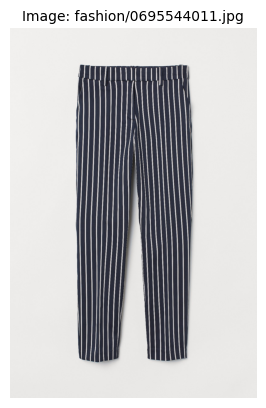

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a pair of pants with a white stripe = 1.000

   Detected tags:
    clothing           = 0.994
    trouser            = 0.931


In [11]:
idx = int(random.uniform(0, len(image_files)))

view_image(image_files[idx])
describe_image_with_AzureCV4(image_files[idx])

In [14]:
num_images_per_row = 10
num_images_per_col = 5

img_size = 200
start = 1000
samples = image_files[start : start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    "RGB", (num_images_per_row * img_size, num_images_per_col * img_size)
)

for idx, image_file in enumerate(samples):
    img = Image.open(image_file)
    img = img.resize((img_size, img_size))
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

## 4. <a name="chapt4"></a> Loading vector embeddings

In [15]:
JSON_DIR = "embeddings"

glob.glob(JSON_DIR + "/*.json")

['embeddings/img_embeddings.json']

In [16]:
print("Importing vectors embeddings...")

jsonfiles = [entry.name for entry in os.scandir(JSON_DIR) if entry.is_file()]
jsonfiles = [f for f in jsonfiles if os.path.isfile(os.path.join(JSON_DIR, f))]

# Get the most recent file
modification_times = [
    (f, os.path.getmtime(os.path.join(JSON_DIR, f))) for f in jsonfiles
]
modification_times.sort(key=lambda x: x[1], reverse=True)
most_recent_file = JSON_DIR + "/" + modification_times[0][0]

# Loading the most recent file
print(f"Loading the most recent file of the vector embeddings: {most_recent_file}")

with open(most_recent_file) as f:
    list_emb = json.load(f)

print(f"\nDone: number of imported vector embeddings = {len(list_emb):,}")

Importing vectors embeddings...
Loading the most recent file of the vector embeddings: embeddings/img_embeddings.json

Done: number of imported vector embeddings = 1,473


## 5. <a name="chapt5"></a> Visual search using a field image

We can use a reference image and find the most similar images.
In this demo we will use the reference image without its background
(Azure Computer Vision 4 can automatically remove the background). The search will be made using the image without its background.


In [17]:
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Total number of catalog images = 1,473


In [18]:
TEST_DIR = "test"

test_images = glob.glob(f"{TEST_DIR}/*")
print(f"Total number of test images = {len(test_images)}")

Total number of test images = 6


### Test 1

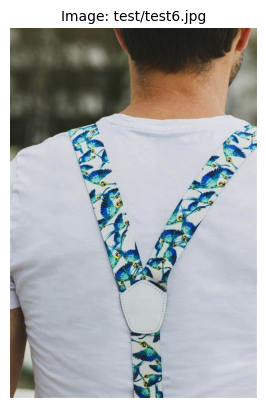

Automatic analysis of the image using Azure Computer Vision 4.0:

   Main caption:
    a person wearing suspenders with birds on them = 1.000

   Detected tags:
    person             = 0.985
    fashion accessory  = 0.983
    necklace           = 0.971
    clothing           = 0.951
    neck               = 0.896
    collar             = 0.858
    jewellery          = 0.854
    wearing            = 0.733
    outdoor            = 0.691
    shirt              = 0.673
    fashion            = 0.514
    man                = 0.441


In [19]:
reference_image = test_images[0]

view_image(reference_image)
describe_image_with_AzureCV4(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


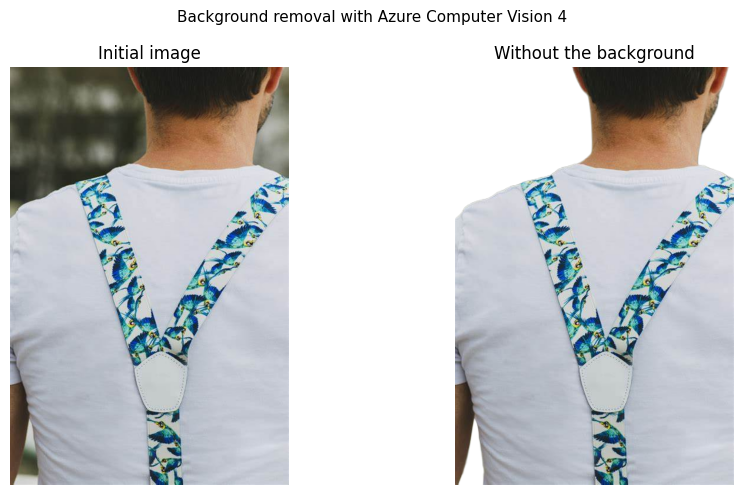

In [20]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0640958003.jpg with similarity index = 0.559664140389159
002 fashion/0698840001.jpg with similarity index = 0.5253307435287258
003 fashion/0642617001.jpg with similarity index = 0.5194644133571216
004 fashion/0646890001.jpg with similarity index = 0.5122939918902177
005 fashion/0622896002.jpg with similarity index = 0.5037042794529726
006 fashion/0641204001.jpg with similarity index = 0.5007838036156318


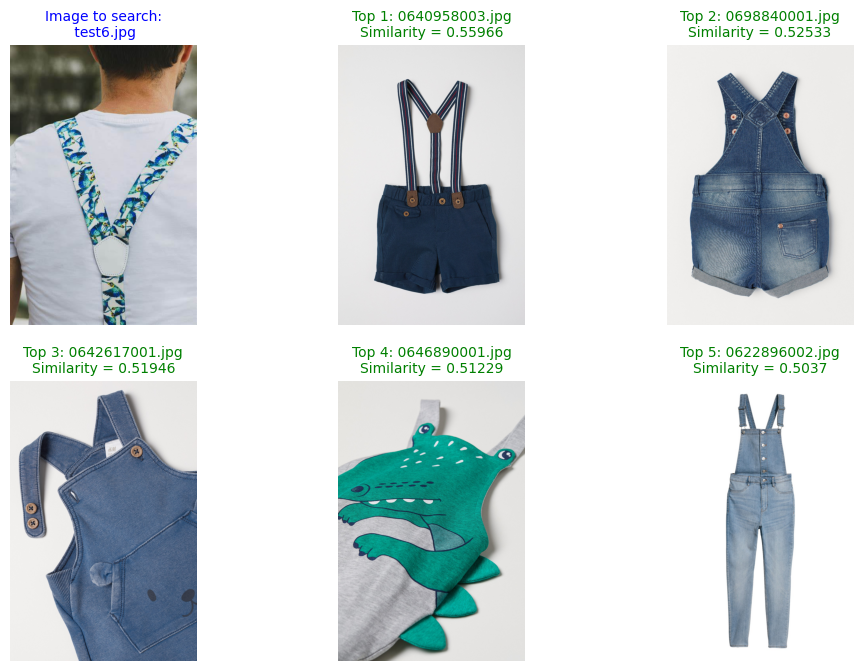

 2023-07-07 21:18:40 Powered by Azure Computer Vision Florence


,image_file,similarity
267,fashion/0640958003.jpg,0.559664
820,fashion/0698840001.jpg,0.525331
1,fashion/0642617001.jpg,0.519464
729,fashion/0646890001.jpg,0.512294
981,fashion/0622896002.jpg,0.503704
...,...,...
599,fashion/0626615007.jpg,0.242742
395,fashion/0696177010.jpg,0.242412
752,fashion/0698328008.jpg,0.237908
778,fashion/0627092001.jpg,0.236238


In [21]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 2

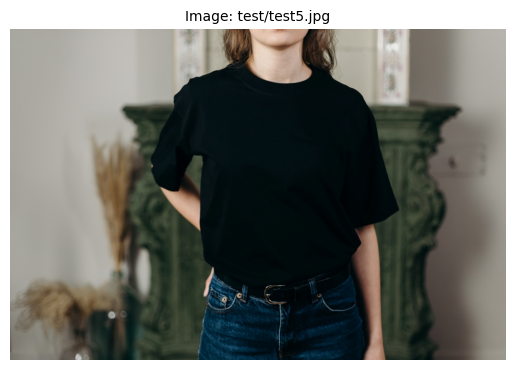

In [22]:
reference_image = test_images[1]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


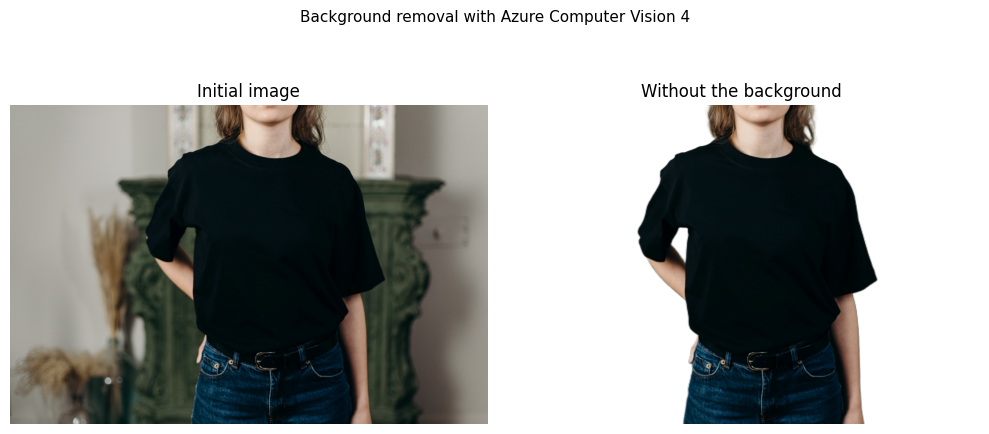

In [23]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0622444001.jpg with similarity index = 0.7066246950563109
002 fashion/0629420001.jpg with similarity index = 0.6812394770765329
003 fashion/0625939002.jpg with similarity index = 0.6769761807843865
004 fashion/0625939017.jpg with similarity index = 0.6668228745319036
005 fashion/0625321003.jpg with similarity index = 0.6598853216664285
006 fashion/0629420019.jpg with similarity index = 0.6594676838626464


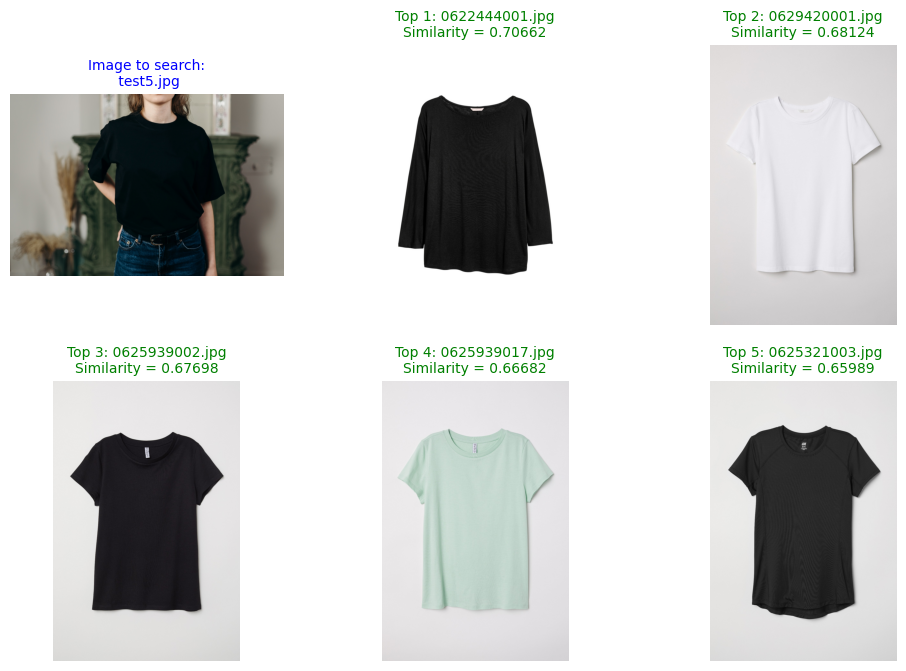

 2023-07-07 21:18:53 Powered by Azure Computer Vision Florence


,image_file,similarity
328,fashion/0622444001.jpg,0.706625
1103,fashion/0629420001.jpg,0.681239
285,fashion/0625939002.jpg,0.676976
307,fashion/0625939017.jpg,0.666823
664,fashion/0625321003.jpg,0.659885
...,...,...
99,fashion/0692705001.jpg,0.306451
629,fashion/0623374005.jpg,0.305953
75,fashion/0645920004.jpg,0.304482
1064,fashion/0695043004.jpg,0.299539


In [24]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 3

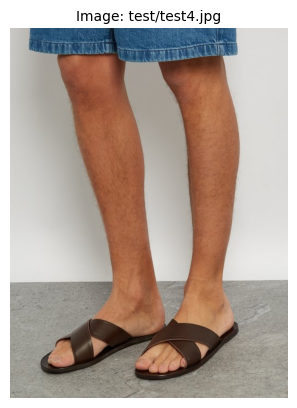

In [25]:
reference_image = test_images[2]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


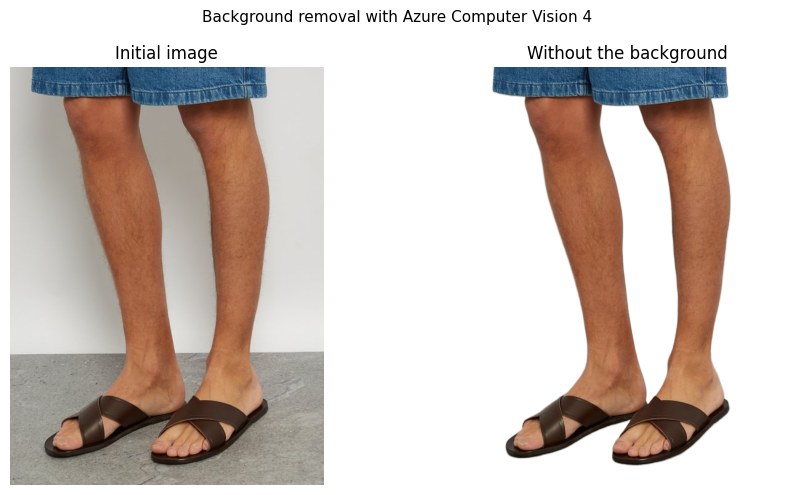

In [26]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0640989002.jpg with similarity index = 0.654865349320946
002 fashion/0623934002.jpg with similarity index = 0.6198993964531482
003 fashion/0621915004.jpg with similarity index = 0.6072370980439064
004 fashion/0620608001.jpg with similarity index = 0.5882134757173155
005 fashion/0620179001.jpg with similarity index = 0.5793781063813075
006 fashion/0629416001.jpg with similarity index = 0.5707911474266743


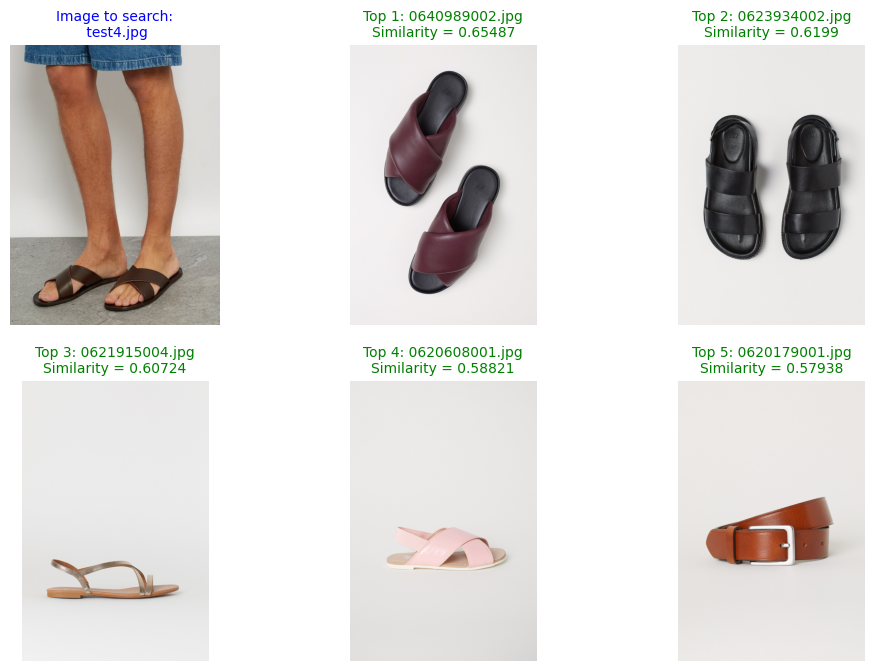

 2023-07-07 21:18:59 Powered by Azure Computer Vision Florence


,image_file,similarity
676,fashion/0640989002.jpg,0.654865
727,fashion/0623934002.jpg,0.619899
1217,fashion/0621915004.jpg,0.607237
1126,fashion/0620608001.jpg,0.588213
956,fashion/0620179001.jpg,0.579378
...,...,...
70,fashion/0646811010.jpg,0.240982
417,fashion/0642975002.jpg,0.236982
7,fashion/0644678006.jpg,0.236341
290,fashion/0626648003.jpg,0.234396


In [27]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 4

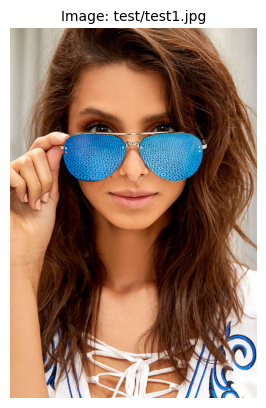

In [28]:
reference_image = test_images[3]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


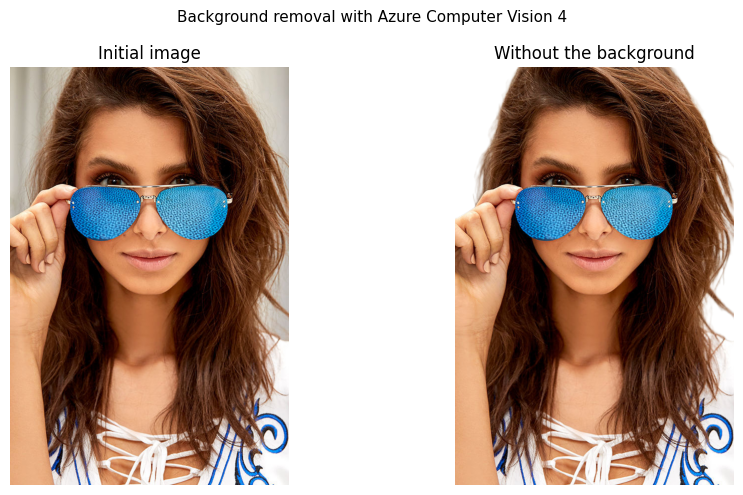

In [29]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0620319010.jpg with similarity index = 0.6376879675486955
002 fashion/0646754002.jpg with similarity index = 0.6054899806975518
003 fashion/0620139003.jpg with similarity index = 0.579542368519298
004 fashion/0623350001.jpg with similarity index = 0.5548793524365196
005 fashion/0398959003.jpg with similarity index = 0.5412405840019359
006 fashion/0629390001.jpg with similarity index = 0.5371788126406433


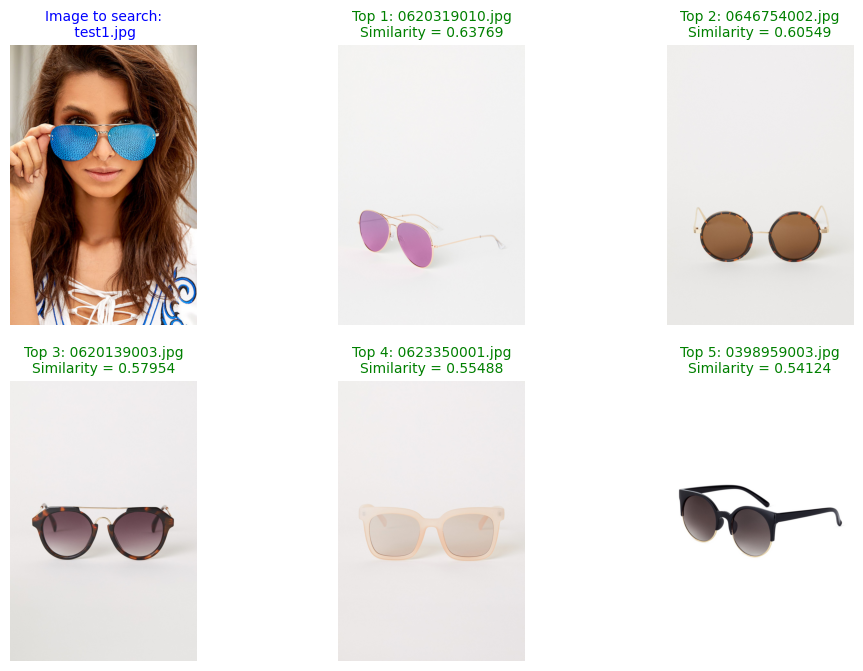

 2023-07-07 21:19:05 Powered by Azure Computer Vision Florence


,image_file,similarity
739,fashion/0620319010.jpg,0.637688
1206,fashion/0646754002.jpg,0.605490
667,fashion/0620139003.jpg,0.579542
374,fashion/0623350001.jpg,0.554879
708,fashion/0398959003.jpg,0.541241
...,...,...
715,fashion/0626443007.jpg,0.234748
1088,fashion/0696991021.jpg,0.230804
974,fashion/0641748010.jpg,0.227736
1235,fashion/0694297002.jpg,0.221313


In [30]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 5

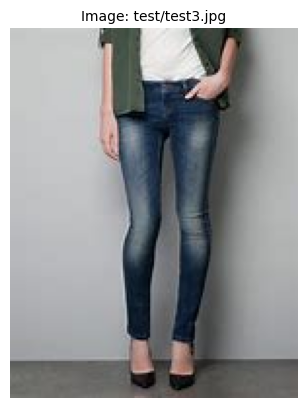

In [31]:
reference_image = test_images[4]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


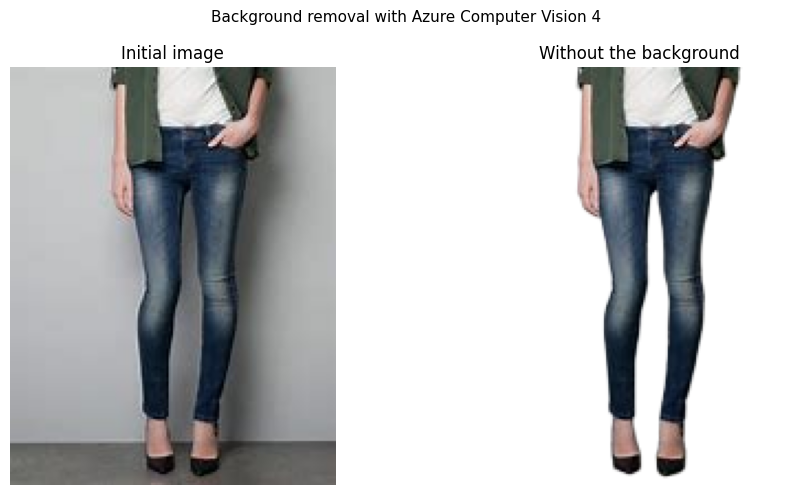

In [32]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 2 images:

001 fashion/0624251001.jpg with similarity index = 0.7146476286235446
002 fashion/0625047001.jpg with similarity index = 0.697337363306941


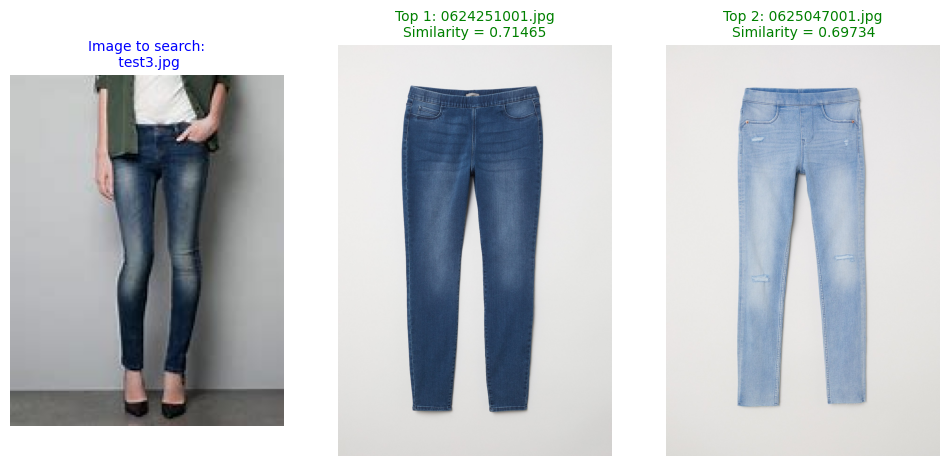

 2023-07-07 21:19:08 Powered by Azure Computer Vision Florence


,image_file,similarity
979,fashion/0624251001.jpg,0.714648
236,fashion/0625047001.jpg,0.697337
370,fashion/0640331007.jpg,0.696573
1237,fashion/0399136060.jpg,0.696530
807,fashion/0698387005.jpg,0.694533
...,...,...
1361,fashion/0695063001.jpg,0.323235
782,fashion/0629656005.jpg,0.322813
879,fashion/0642779001.jpg,0.304378
437,fashion/0695039001.jpg,0.291229


In [33]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=2, disp=True
)

### Test 6

In [34]:
# We can download an image from an url
image_URL = "https://github.com/retkowsky/images/blob/master/fashion_image.jpg?raw=true"
reference_image = "download.jpg"

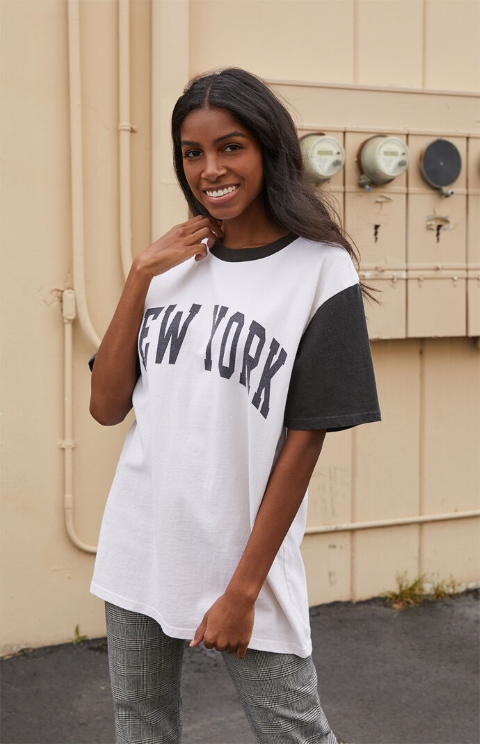

In [35]:
image = get_image_from_url(image_URL)
image

Removing background from the image using Azure Computer Vision 4.0...
Done


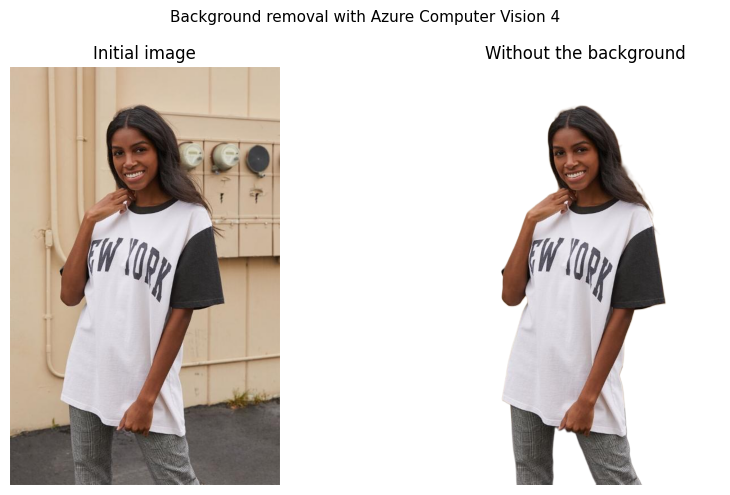

In [36]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 fashion/0699923102.jpg with similarity index = 0.7304154061230763
002 fashion/0648703010.jpg with similarity index = 0.6889268455114571
003 fashion/0642973002.jpg with similarity index = 0.6656481592763472
004 fashion/0649440014.jpg with similarity index = 0.6535851554400522
005 fashion/0641748019.jpg with similarity index = 0.6042032769906023
006 fashion/0698943005.jpg with similarity index = 0.5917652527358375


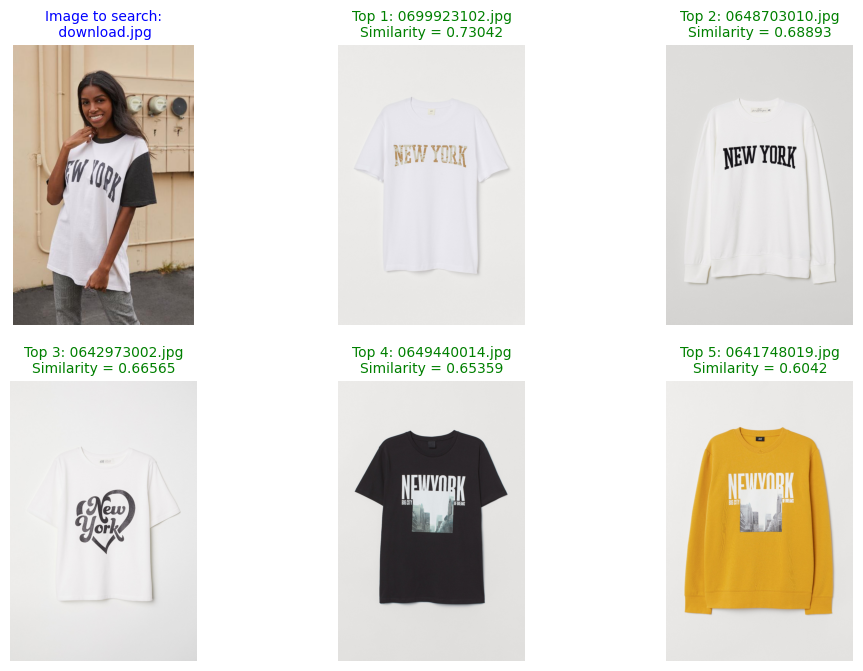

 2023-07-07 21:19:14 Powered by Azure Computer Vision Florence


,image_file,similarity
827,fashion/0699923102.jpg,0.730415
92,fashion/0648703010.jpg,0.688927
126,fashion/0642973002.jpg,0.665648
1051,fashion/0649440014.jpg,0.653585
612,fashion/0641748019.jpg,0.604203
...,...,...
589,fashion/0646429003.jpg,0.280072
90,fashion/0696201003.jpg,0.273909
122,fashion/0625722001.jpg,0.270223
354,fashion/0625027008.jpg,0.268886


In [37]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

## 6. <a name="chapt6"></a> Visual search using some text

We can use some prompt (text) to find some articles in our catalog images.

### Test 1

In [38]:
query = "shirt with stripped lines on it"


Similar images using query = shirt with stripped lines on it


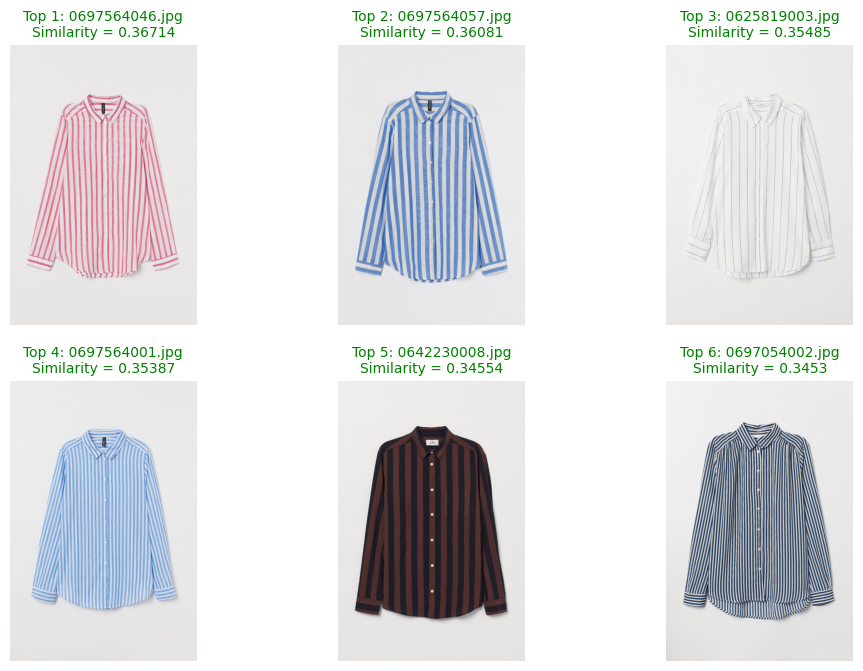

 2023-07-07 21:19:15 Powered by Azure Computer Vision Florence


,image_file,similarity
1083,fashion/0697564046.jpg,0.367135
1386,fashion/0697564057.jpg,0.360808
509,fashion/0625819003.jpg,0.354853
622,fashion/0697564001.jpg,0.353875
1019,fashion/0642230008.jpg,0.345544
...,...,...
637,fashion/0695001001.jpg,0.103351
834,fashion/0644370001.jpg,0.100075
99,fashion/0692705001.jpg,0.095074
524,fashion/0641521002.jpg,0.092729


In [39]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 2

In [40]:
query = "torn blue jeans"


Similar images using query = torn blue jeans


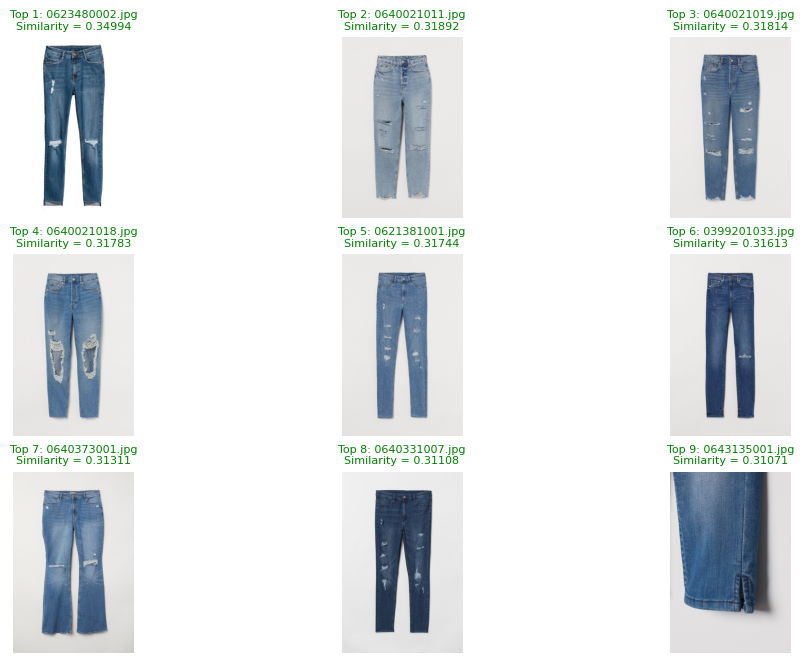

 2023-07-07 21:19:17 Powered by Azure Computer Vision Florence


,image_file,similarity
1338,fashion/0623480002.jpg,0.349938
1231,fashion/0640021011.jpg,0.318917
130,fashion/0640021019.jpg,0.318138
132,fashion/0640021018.jpg,0.317832
755,fashion/0621381001.jpg,0.317445
...,...,...
490,fashion/0696628002.jpg,0.073262
1459,fashion/0696316001.jpg,0.070425
1345,fashion/0697506001.jpg,0.068040
637,fashion/0695001001.jpg,0.067028


In [41]:
get_results_using_prompt(query, image_files, list_emb, topn=9, disp=False)

### Test 3

In [42]:
query = "red dress with long sleeves"


Similar images using query = red dress with long sleeves


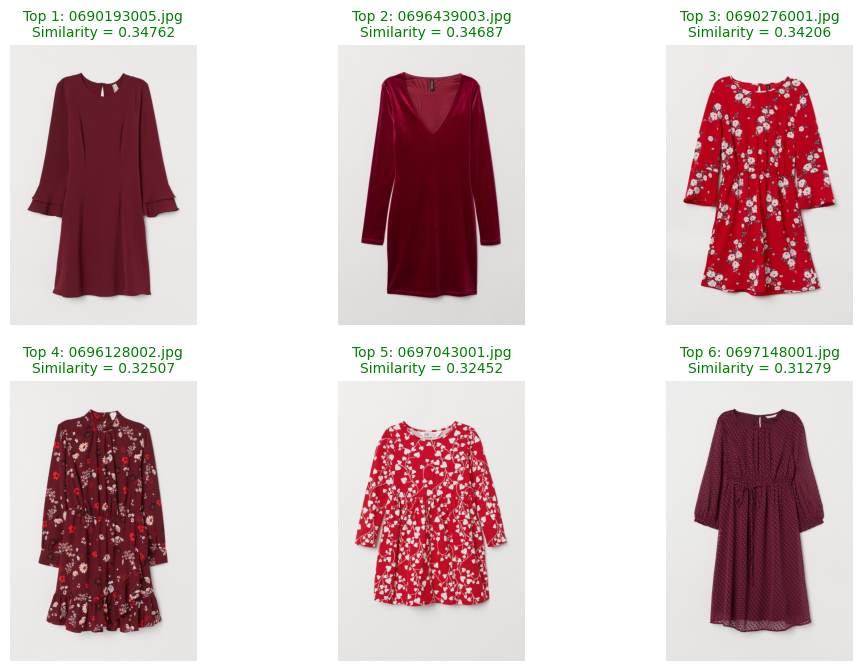

 2023-07-07 21:19:18 Powered by Azure Computer Vision Florence


,image_file,similarity
762,fashion/0690193005.jpg,0.347616
432,fashion/0696439003.jpg,0.346867
675,fashion/0690276001.jpg,0.342055
321,fashion/0696128002.jpg,0.325065
38,fashion/0697043001.jpg,0.324517
...,...,...
841,fashion/0624543063.jpg,0.036930
1148,fashion/0695803006.jpg,0.035648
660,fashion/0694739003.jpg,0.034913
192,fashion/0621768001.jpg,0.034055


In [43]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 4

In [44]:
query = "dress with flowers"


Similar images using query = dress with flowers


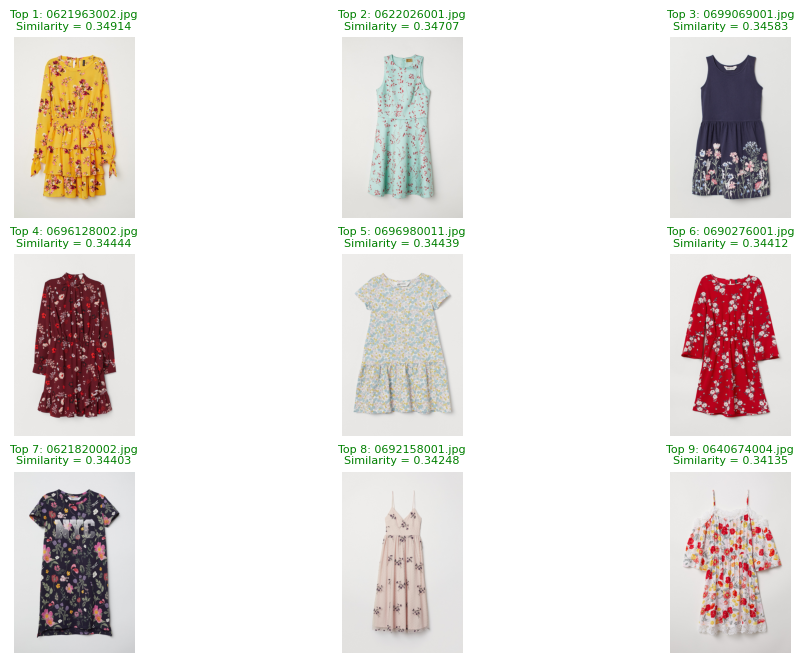

 2023-07-07 21:19:20 Powered by Azure Computer Vision Florence


,image_file,similarity
256,fashion/0621963002.jpg,0.349145
662,fashion/0622026001.jpg,0.347073
1307,fashion/0699069001.jpg,0.345827
321,fashion/0696128002.jpg,0.344442
850,fashion/0696980011.jpg,0.344388
...,...,...
192,fashion/0621768001.jpg,0.079335
757,fashion/0621760008.jpg,0.077830
806,fashion/0625420001.jpg,0.077002
1111,fashion/0647207008.jpg,0.065983


In [45]:
get_results_using_prompt(query, image_files, list_emb, topn=9, disp=False)

### Test 5

In [46]:
query = "pink shoes"


Similar images using query = pink shoes


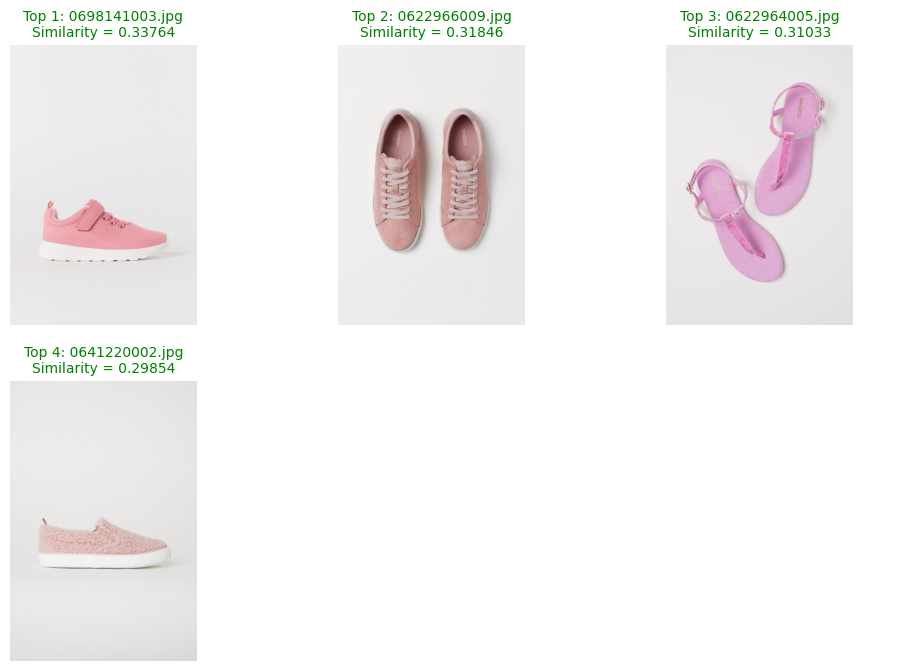

 2023-07-07 21:19:27 Powered by Azure Computer Vision Florence


,image_file,similarity
1018,fashion/0698141003.jpg,0.337636
1205,fashion/0622966009.jpg,0.318462
106,fashion/0622964005.jpg,0.310333
842,fashion/0641220002.jpg,0.298539
1365,fashion/0625662004.jpg,0.292183
...,...,...
181,fashion/0694709003.jpg,0.068986
176,fashion/0694709017.jpg,0.068336
1112,fashion/0695442001.jpg,0.064139
812,fashion/0695411001.jpg,0.059878


In [47]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 6

In [48]:
query = "ray-ban with yellow frames"


Similar images using query = ray-ban with yellow frames


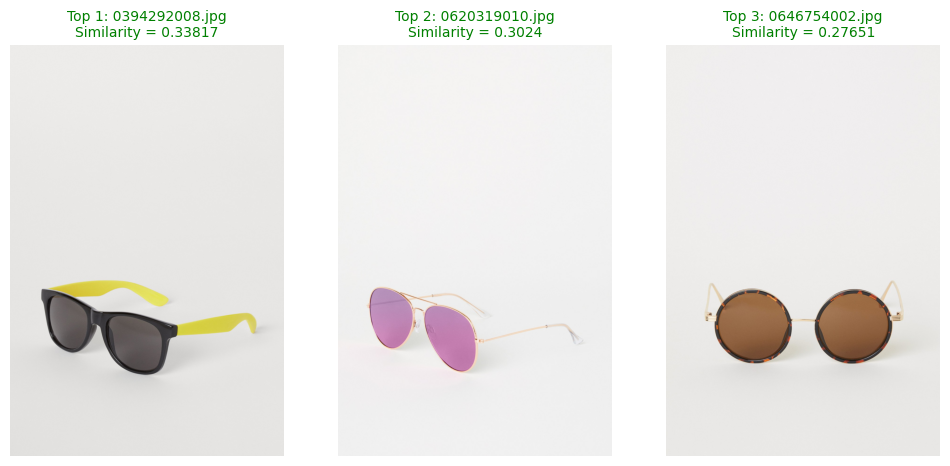

 2023-07-07 21:19:31 Powered by Azure Computer Vision Florence


,image_file,similarity
1124,fashion/0394292008.jpg,0.338169
739,fashion/0620319010.jpg,0.302402
1206,fashion/0646754002.jpg,0.276508
1300,fashion/0646756002.jpg,0.274871
374,fashion/0623350001.jpg,0.262421
...,...,...
213,fashion/0699349002.jpg,0.077770
1074,fashion/0622955007.jpg,0.077604
1213,fashion/0625930001.jpg,0.075678
1104,fashion/0640735003.jpg,0.075048


In [49]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 7

In [50]:
query = "shirt with NYC written on it"


Similar images using query = shirt with NYC written on it


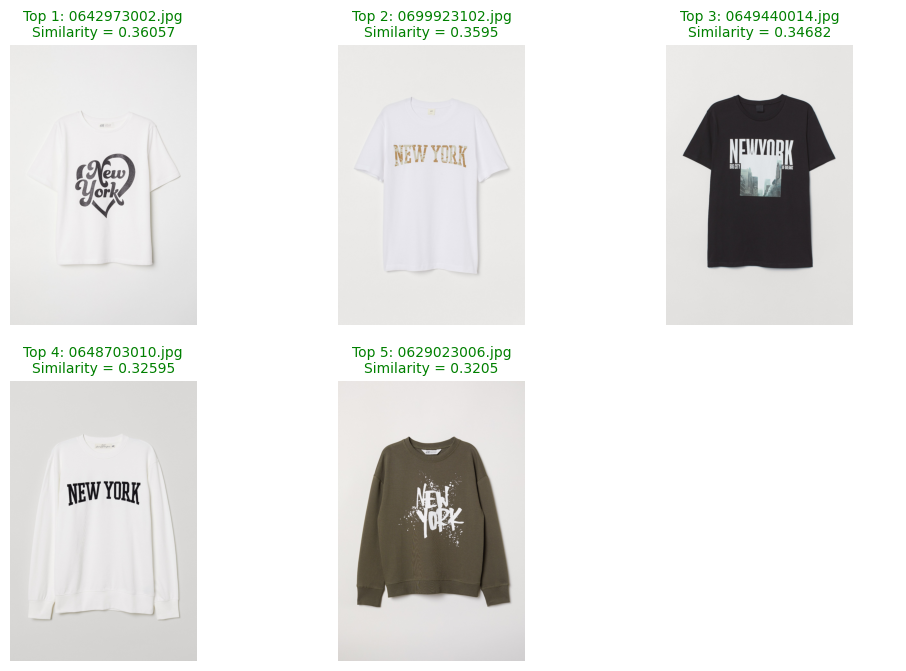

 2023-07-07 21:19:35 Powered by Azure Computer Vision Florence


,image_file,similarity
126,fashion/0642973002.jpg,0.360574
827,fashion/0699923102.jpg,0.359496
1051,fashion/0649440014.jpg,0.346815
92,fashion/0648703010.jpg,0.325946
824,fashion/0629023006.jpg,0.320503
...,...,...
1126,fashion/0620608001.jpg,0.058687
1048,fashion/0624216001.jpg,0.055031
676,fashion/0640989002.jpg,0.053838
637,fashion/0695001001.jpg,0.047914


In [51]:
get_results_using_prompt(query, image_files, list_emb, topn=5, disp=False)

### Test 8

In [52]:
query = "bag with golden lace"


Similar images using query = bag with golden lace


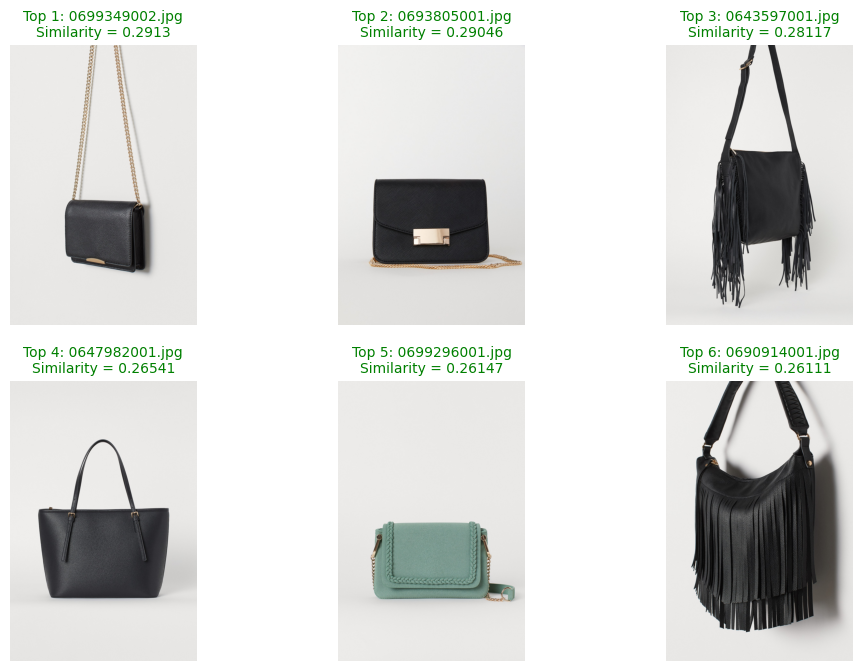

 2023-07-07 21:19:38 Powered by Azure Computer Vision Florence


,image_file,similarity
213,fashion/0699349002.jpg,0.291298
813,fashion/0693805001.jpg,0.290455
1184,fashion/0643597001.jpg,0.281173
1080,fashion/0647982001.jpg,0.265408
363,fashion/0699296001.jpg,0.261474
...,...,...
1172,fashion/0646195001.jpg,0.058668
693,fashion/0624486091.jpg,0.058398
1112,fashion/0695442001.jpg,0.050721
192,fashion/0621768001.jpg,0.049077


In [53]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 9

In [54]:
query = "dreams"

Top 3 images:

001 fashion/0620008004.jpg with similarity index = 0.2852987869618678
002 fashion/0625648002.jpg with similarity index = 0.256775011806006
003 fashion/0640536001.jpg with similarity index = 0.23736517932724288

Similar images using query = dreams


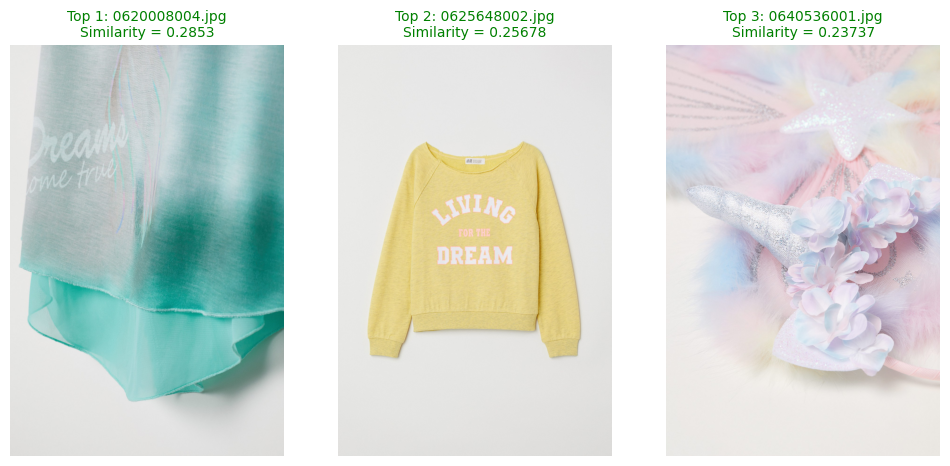

 2023-07-07 21:19:40 Powered by Azure Computer Vision Florence


,image_file,similarity
853,fashion/0620008004.jpg,0.285299
1409,fashion/0625648002.jpg,0.256775
1113,fashion/0640536001.jpg,0.237365
407,fashion/0628755002.jpg,0.229557
496,fashion/0625179002.jpg,0.226237
...,...,...
422,fashion/0626705004.jpg,0.115121
1218,fashion/0645891001.jpg,0.114446
244,fashion/0691527002.jpg,0.114037
1081,fashion/0628499008.jpg,0.112891


In [55]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=True)

### Test 10

In [56]:
query = "article with a bird"


Similar images using query = article with a bird


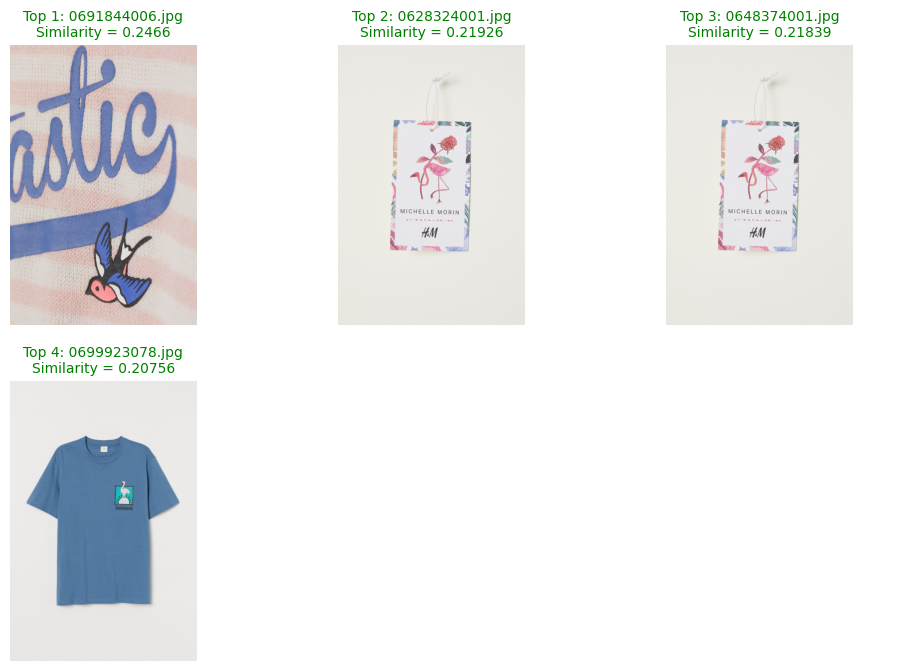

 2023-07-07 21:19:41 Powered by Azure Computer Vision Florence


,image_file,similarity
547,fashion/0691844006.jpg,0.246601
792,fashion/0628324001.jpg,0.219264
973,fashion/0648374001.jpg,0.218386
695,fashion/0699923078.jpg,0.207556
407,fashion/0628755002.jpg,0.199306
...,...,...
1104,fashion/0640735003.jpg,0.060235
754,fashion/0621760009.jpg,0.059821
708,fashion/0398959003.jpg,0.058336
888,fashion/0698647010.jpg,0.045826


In [57]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 11

In [58]:
query = "Italian or Japanese cities"


Similar images using query = Italian or Japanese cities


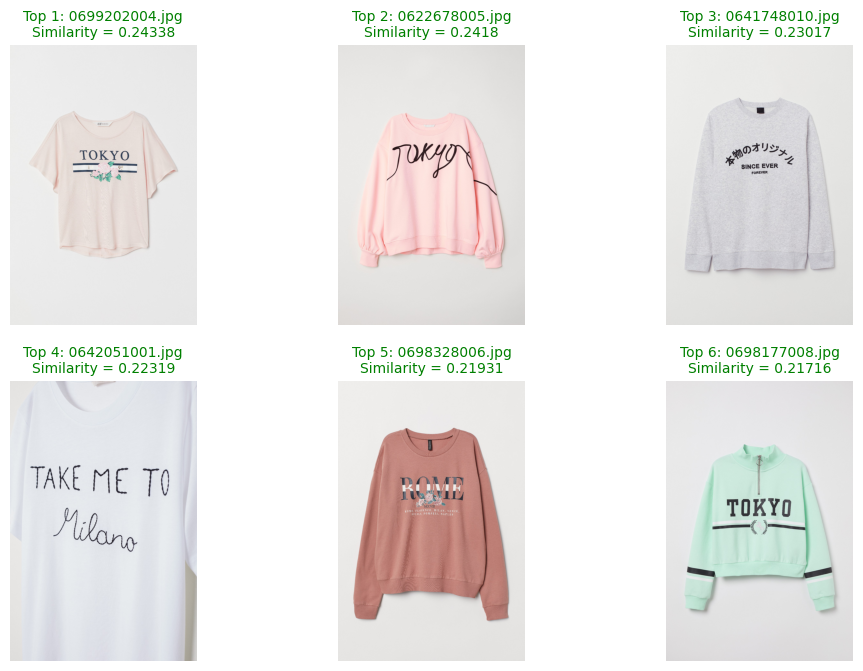

 2023-07-07 21:19:45 Powered by Azure Computer Vision Florence


,image_file,similarity
55,fashion/0699202004.jpg,0.243384
1299,fashion/0622678005.jpg,0.241797
974,fashion/0641748010.jpg,0.230172
1393,fashion/0642051001.jpg,0.223186
583,fashion/0698328006.jpg,0.219310
...,...,...
926,fashion/0643628003.jpg,0.090990
864,fashion/0643350001.jpg,0.090571
828,fashion/0696148002.jpg,0.090298
1288,fashion/0622845004.jpg,0.088350


In [59]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 12

In [60]:
query = "leather belt"


Similar images using query = leather belt


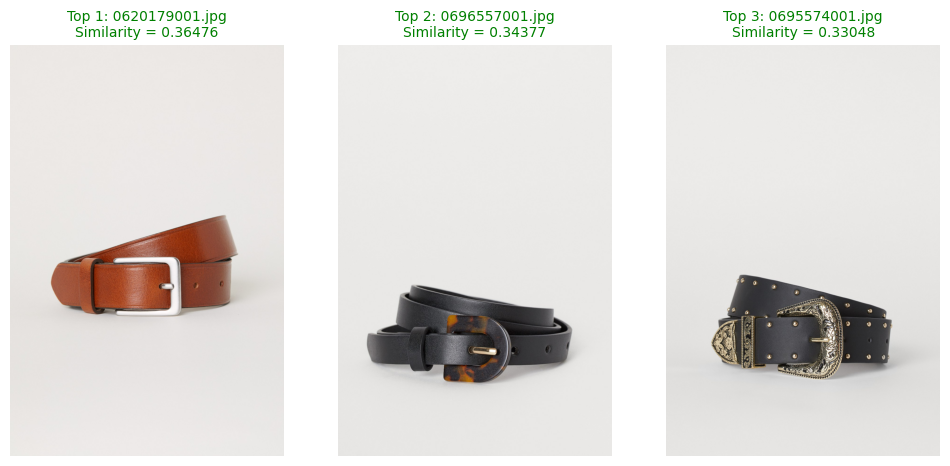

 2023-07-07 21:19:46 Powered by Azure Computer Vision Florence


,image_file,similarity
956,fashion/0620179001.jpg,0.364762
1161,fashion/0696557001.jpg,0.343767
1130,fashion/0695574001.jpg,0.330481
1316,fashion/0642268001.jpg,0.308894
728,fashion/0641204001.jpg,0.297197
...,...,...
716,fashion/0623997001.jpg,0.127933
782,fashion/0629656005.jpg,0.126950
1297,fashion/0697532004.jpg,0.126255
828,fashion/0696148002.jpg,0.124021


In [61]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 13

In [62]:
query = "butterfly hair pin"


Similar images using query = butterfly hair pin


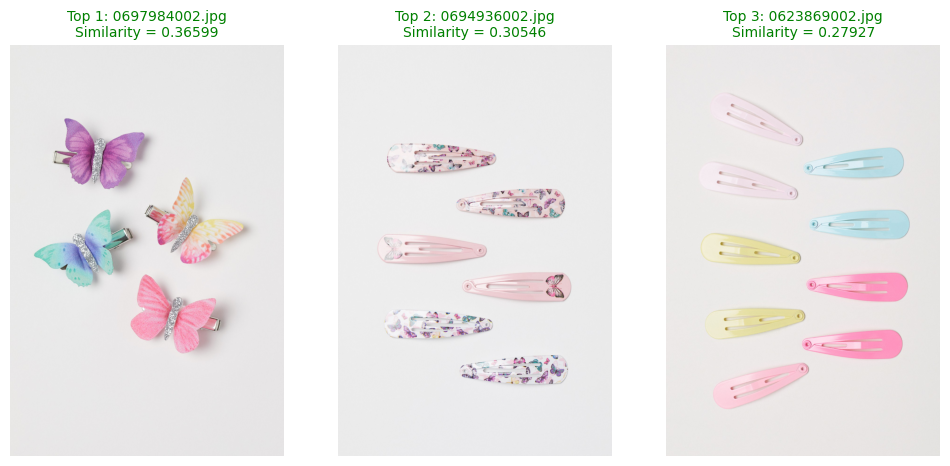

 2023-07-07 21:19:49 Powered by Azure Computer Vision Florence


,image_file,similarity
866,fashion/0697984002.jpg,0.365994
123,fashion/0694936002.jpg,0.305462
1319,fashion/0623869002.jpg,0.279268
554,fashion/0697112001.jpg,0.253888
625,fashion/0629485001.jpg,0.253165
...,...,...
732,fashion/0697920007.jpg,0.062326
600,fashion/0697920035.jpg,0.056383
1111,fashion/0647207008.jpg,0.053636
332,fashion/0697920055.jpg,0.053091


In [63]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 14

In [64]:
query = "shirt with shark, dolphin, fish or whale"


Similar images using query = shirt with shark, dolphin, fish or whale


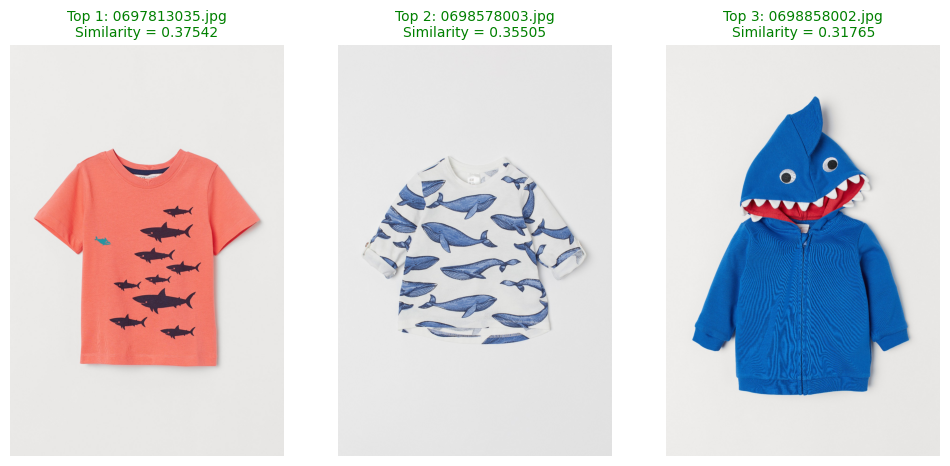

 2023-07-07 21:19:50 Powered by Azure Computer Vision Florence


,image_file,similarity
835,fashion/0697813035.jpg,0.375422
1084,fashion/0698578003.jpg,0.355051
1263,fashion/0698858002.jpg,0.317655
722,fashion/0699145001.jpg,0.307817
959,fashion/0699923066.jpg,0.298466
...,...,...
572,fashion/0649555002.jpg,0.043169
950,fashion/0640990001.jpg,0.042450
676,fashion/0640989002.jpg,0.038558
624,fashion/0647946004.jpg,0.037151


In [65]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

> In the next notebook we will do some image clustering using vector embeddings